In [1]:
# Import that good good
import sys
import os
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np 
import math
from IPython.display import display
from collections import OrderedDict
pd.options.display.max_rows = 2
import matplotlib.colors as mc
import colorsys
import matplotlib.font_manager as font_manager
from scipy.optimize import curve_fit
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
import math
# Figure dimensions (inches)
# 2 x 1.8

In [2]:
#Here are my rc parameters for matplotlib
mpl.rc('font', serif='Helvetica Neue') 
mpl.rcParams.update({'font.size': 9})
mpl.rcParams['figure.figsize'] = 3.2, 2.8
mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['lines.linewidth'] = 0.5

In [24]:
# Functions will all go here
def getFromTxt(fname, first, last):
    """Takes a string, text before and after desired text, outs text between"""
    start = fname.index( first ) + len( first )
    end = fname.index( last, start )
    myTxt = fname[start:end]
    return float(myTxt)

def doSort(arr):
    for i in xrange(len(arr)):
        for j in xrange(len(arr)):
            if arr[i] < arr[j] and i > j:
                tmp = arr[i]
                arr[i] = arr[j]
                arr[j] = tmp
                
def slowSort(array):
    """Sort an array the slow (but certain) way"""
    cpy = np.copy(array)
    ind = np.arange(0, len(array))
    for i in xrange(len(cpy)):
        for j in xrange(len(cpy)):
            if cpy[i] > cpy[j] and i < j:
                # Swap the copy array values
                tmp = cpy[i]
                cpy[i] = cpy[j]
                cpy[j] = tmp
                # Swap the corresponding indices
                tmp = ind[i]
                ind[i] = ind[j]
                ind[j] = tmp
    return ind

def indSort(arr1, arr2):
    """Take sorted index array, use to sort array"""
    # arr1 is array to sort
    # arr2 is index array
    cpy = np.copy(arr1)
    for i in xrange(len(arr1)):
        arr1[i] = cpy[arr2[i]]
            
def chkSort(array):
    """Make sure array is chronilogical"""
    for i in xrange(len(array)-2):
        if array[i] > array[i+1]:
            print("{} is not greater than {} for indices=({},{})").format(array[i+1], array[i], i, i+1)
            return False
    return True

# This will find my installation of whingdingdilly wherever it is installed
def find(name):
    home = os.path.expanduser("~")
    for root, dirs, files in os.walk(home):
        if name in dirs:
            return os.path.join(root, name)
        
def computeTauPerTstep(epsilon):
    sigma = 1.0
    threeEtaPiSigma = 1.0
    runFor = 200
    tauBrown = 1.0
    
    tauLJ = ((sigma**2) * threeEtaPiSigma) / epsilon
    dt = 0.00001 * tauLJ
    simLength = runFor * tauBrown
    totTsteps = int(simLength / dt)
    tstepPerTau = int(totTsteps / float(simLength))
    return tstepPerTau

def linearRel(m, x, b):
    return b * (x**m)
  
def loglogStraight(x, a, b):
    return a * (x**b)

def plotFit(xdata, ydata):
    popt, pcov = curve_fit(loglogStraight, xdata, ydata)
    plt.loglog(xdata, loglogStraight(xdata, *popt),
               label='fit PeR=' + str(params['peR'][i]) + ': b=%5.3f' % (popt[1]))
    
myCols1 = ['#1A1334',
          '#26284A',
          '#01545B',
          '#017351',
          '#02C383',
          '#AAD962',
          '#FABF45',
          '#EF6A32',
          '#ED0245',
          '#A1295E',
          '#700161']
myCols = ['#26284A',
          '#01545B',
          '#017351',
          '#02C383',
          '#AAD962',
          '#FABF45',
          '#EF6A32',
          '#ED0245',
          '#A1295E',
          '#700161']
def getCol(xA):
    index = int(xA / 10)
    return myCols[index]

In [4]:
# Get the relevant paths
whingPath = find('whingdingdilly')
ipyPath = whingPath + '/ipython'
constPath = ipyPath + '/constant_ratio'
dataPath = constPath + '/constRatTxt'

# Go to the correct parent directory
os.chdir(constPath)
txtFiles = os.listdir(dataPath)
numFiles = len(txtFiles)
all_sims = []

In [5]:
# You want to load the data in so that it's sorted to begin with
paList = []
for i in xrange(numFiles):
    paList.append(getFromTxt(txtFiles[i], "pa", "_pb"))
indArr = slowSort(paList)
indSort(txtFiles, indArr)

In [6]:
# Using the absolute path means I can go to whatever directory I want
os.chdir(dataPath)
for i in xrange(numFiles):
    df = pd.read_csv(txtFiles[i], sep='\s+', header=0)
    all_sims.append(df)
    
# Return to root directory
os.chdir(constPath)

In [7]:
# Check to see if timesteps are in order
for i in xrange(numFiles):
    myBool = chkSort(all_sims[i]['Timestep'])
    if myBool is False:
        print("Source files are not chronilogically sorted!")
        exit(1)
    else:
        print("{} sorted... ").format(txtFiles[i])

diam_pa10_pb14_xa50_ep4.txt sorted... 
diam_pa10_pb20_xa50_ep5.txt sorted... 
diam_pa10_pb33_xa50_ep7.txt sorted... 
diam_pa10_pb11_xa50_ep3.txt sorted... 
diam_pa20_pb40_xa50_ep8.txt sorted... 
diam_pa20_pb28_xa50_ep6.txt sorted... 
diam_pa20_pb22_xa50_ep5.txt sorted... 
diam_pa20_pb66_xa50_ep12.txt sorted... 
diam_pa30_pb33_xa50_ep7.txt sorted... 
diam_pa30_pb42_xa50_ep8.txt sorted... 
diam_pa30_pb60_xa50_ep11.txt sorted... 
diam_pa30_pb100_xa50_ep18.txt sorted... 
diam_pa40_pb80_xa50_ep14.txt sorted... 
diam_pa40_pb44_xa50_ep9.txt sorted... 
diam_pa40_pb133_xa50_ep23.txt sorted... 
diam_pa40_pb57_xa50_ep11.txt sorted... 
diam_pa50_pb166_xa50_ep28.txt sorted... 
diam_pa50_pb71_xa50_ep13.txt sorted... 
diam_pa50_pb55_xa50_ep10.txt sorted... 
diam_pa50_pb100_xa50_ep18.txt sorted... 
diam_pa60_pb200_xa50_ep34.txt sorted... 
diam_pa60_pb120_xa50_ep21.txt sorted... 
diam_pa60_pb66_xa50_ep12.txt sorted... 
diam_pa60_pb85_xa50_ep15.txt sorted... 
diam_pa70_pb233_xa50_ep39.txt sorted... 
dia

In [18]:
# Add a column to the all_sims dataframe for number of clusters (of threshold size):
for i in xrange(numFiles):
    # New column for number of clusters
    all_sims[i]['nClust'] = all_sims[i]['Dense_tot'] / all_sims[i]['MCS']
    # Ger rid of NaN in favor of 0
    all_sims[i].fillna(0, inplace=True)

display(all_sims[0])

,Timestep,Gas_A,Gas_B,Gas_tot,Dense_A,Dense_B,Dense_tot,Lc_numA,Lc_numB,Lg_clust,...,sigAA,sigAB,sigBB,phiEff,lg_clustA,tot_clustA,LC_density,DP_density,GP_density,nClust
0,0.0,25000,25000,50000,0,0,0,4,3,7,...,1.0050,1.0128,1.0032,0.6,5.5,0.0,1.26,0.0,0.76,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
550,19800000.0,25000,25000,50000,0,0,0,11,6,17,...,1.0032,1.0034,1.0062,0.6,13.5,0.0,1.26,0.0,0.76,0.0


In [22]:
# Make an additional frame that gives total number of particles, and simulation parameters
paramList = []
for i in xrange(numFiles):
    partAll = all_sims[i]['Gas_tot'][0]
    partA = all_sims[i]['Gas_A'][0]
    partB = all_sims[i]['Gas_B'][0]
    pa = getFromTxt(txtFiles[i], "pa", "_pb")
    pb = getFromTxt(txtFiles[i], "pb", "_xa")
    xa = getFromTxt(txtFiles[i], "xa", "_ep")
    ep = getFromTxt(txtFiles[i], "ep", ".txt")
    converT = computeTauPerTstep(ep)
    
    try:
        # Round to the nearest tenths place
        prat = round(float(pa)/float(pb), 1)
    except:
        prat = 0.0
    paramList.append((partAll, partA, partB, pa, pb, xa, prat, ep, converT))

params = pd.DataFrame(paramList, columns=['partAll', 'partA', 'partB', 'peA', 'peB', 'xA', 'peR', 'eps', 'brownTime'])
display(params)

,partAll,partA,partB,peA,peB,xA,peR,eps,brownTime
0,50000,25000,25000,10.0,14.0,50.0,0.7,4.0,400000
...,...,...,...,...,...,...,...,...,...
58,50000,25000,25000,150.0,214.0,50.0,0.7,36.0,3600000


In [27]:
# How many frames to average over for steady-state
avgOver = 5

# Make list of steady state column headers
headers = list(all_sims[0])
headers.remove('Timestep')
SS = pd.DataFrame(columns=headers)
stdErr = pd.DataFrame(columns=headers)
for i in range(0, len(txtFiles)):
    SS.loc[i] = [0] * len(headers)
    stdErr.loc[i] = [0] * len(headers)

# Make dataframe of steady-state data
for i in range(0, len(txtFiles)):
    # Loop through each column (aside from tstep column)
    for j in range(1, len(headers) + 1):
        # Compute mean of last 100 entries in jth column of ith file
        avg = np.mean(all_sims[i].iloc[-avgOver:-1,j])
        SS[headers[j-1]][i] = avg
        # Compute the standard deviation in this data
        stdError = np.std(all_sims[i].iloc[-avgOver:-1,j])
        stdErr[headers[j-1]][i] = stdError
        
# Normalize by number of particles
for i in xrange(len(txtFiles)):
    if params['partA'][i] != 0:
        SS['Gas_A'][i] /= params['partA'][i]
        SS['Dense_A'][i] /= params['partA'][i]
        SS['Lc_numA'][i] /= params['partA'][i]
        stdErr['Gas_A'][i] /= params['partA'][i]
        stdErr['Dense_A'][i] /= params['partA'][i]
        stdErr['Lc_numA'][i] /= params['partA'][i]
        
    if params['partB'][i] != 0:
        SS['Gas_B'][i] /= params['partB'][i]
        SS['Dense_B'][i] /= params['partB'][i]
        SS['Lc_numB'][i] /= params['partB'][i]
        stdErr['Gas_B'][i] /= params['partB'][i]
        stdErr['Dense_B'][i] /= params['partB'][i]
        stdErr['Lc_numB'][i] /= params['partB'][i]

SS['Gas_tot'][:] /= params['partAll'][:]
SS['Dense_tot'][:] /= params['partAll'][:] 
SS['Lg_clust'][:] /= params['partAll'][:] 
SS['MCS'][:] /= params['partAll'][:]
stdErr['Gas_tot'][:] /= params['partAll'][:]
stdErr['Dense_tot'][:] /= params['partAll'][:] 
stdErr['Lg_clust'][:] /= params['partAll'][:] 
stdErr['MCS'][:] /= params['partAll'][:]

SS['Gas_A'][:] *= 100.0
SS['Gas_B'][:] *= 100.0
SS['Gas_tot'][:] *= 100.0
SS['Dense_A'][:] *= 100.0
SS['Dense_B'][:] *= 100.0
SS['Dense_tot'][:] *= 100.0
SS['Lc_numA'][:] *= 100.0
SS['Lc_numB'][:] *= 100.0
SS['Lg_clust'][:] *= 100.0
SS['MCS'][:] *= 100.0
stdErr['Gas_A'][:] *= 100.0
stdErr['Gas_B'][:] *= 100.0
stdErr['Gas_tot'][:] *= 100.0
stdErr['Dense_A'][:] *= 100.0
stdErr['Dense_B'][:] *= 100.0
stdErr['Dense_tot'][:] *= 100.0
stdErr['Lc_numA'][:] *= 100.0
stdErr['Lc_numB'][:] *= 100.0
stdErr['Lg_clust'][:] *= 100.0
stdErr['MCS'][:] *= 100.0
display(SS)
display(stdErr)

# Get an idea for what section of the data we are averaging over
for i in xrange(len(txtFiles)):
    if params['peA'][i] == 0 and params['xA'][i] != 100 and params['xA'][i] != 0:
        plt.plot(all_sims[i]['Timestep'][:] / params['brownTime'][i],
                 all_sims[i]['Dense_A'][:] / params['partA'][i] * 100.0,
                 c=getCol(params['xA'][i]),
                 label=str(params['xA'][i]))
        plt.plot(all_sims[i]['Timestep'][-avgOver:-1] / params['brownTime'][i],
                 all_sims[i]['Dense_A'][-avgOver:-1] / params['partA'][i] * 100.0,
                 c='k')
        
plt.show()

,Gas_A,Gas_B,Gas_tot,Dense_A,Dense_B,Dense_tot,Lc_numA,Lc_numB,Lg_clust,MCS,...,sigAA,sigAB,sigBB,phiEff,lg_clustA,tot_clustA,LC_density,DP_density,GP_density,nClust
0,100,100,100,0,0,0,0.033,0.033,0.033,0,...,1.01165,1.0046,1.00283,0.6,13.15,0,1.255,0,0.76,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,9.188,6.823,8.0055,90.812,93.177,91.9945,90.812,93.177,91.9945,91.9945,...,1.00005,1.0002,1.00005,0.6,36129.8,36129.8,1.27,1.27,0.1375,1


,Gas_A,Gas_B,Gas_tot,Dense_A,Dense_B,Dense_tot,Lc_numA,Lc_numB,Lg_clust,MCS,...,sigAA,sigAB,sigBB,phiEff,lg_clustA,tot_clustA,LC_density,DP_density,GP_density,nClust
0,0,0,0,0,0,0,0.0103441,0.00714143,0.00538516,0,...,0.00630417,0.00223159,0.00134234,0,2.17543,0,0.0111803,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,0.361397,0.166358,0.261306,0.361397,0.166358,0.261306,0.361397,0.166358,0.261306,0.261306,...,0.00015,7.07107e-05,5e-05,0,96.8737,96.8737,0,0,0.00433013,0


In [9]:
# Make list of steady state column headers
headers = list(all_sims[0])
headers.remove('Timestep')
SS = pd.DataFrame(columns=headers)
for i in xrange(numFiles):
    SS.loc[i] = [0] * len(headers)

ssFrames = -20
# Make dataframe of steady-state data
for i in xrange(numFiles):
    # Loop through each column (aside from tstep column)
    for j in range(1, len(headers) + 1):
        # Compute mean of last 100 entries in jth column of ith file
        avg = np.mean(all_sims[i].iloc[ssFrames:-1,j])
        SS[headers[j-1]][i] = avg
        
# Normalize by number of particles
SS['Gas_A'][:] /= params['partA'][:] 
SS['Gas_B'][:] /= params['partB'][:] 
SS['Gas_tot'][:] /= params['partAll'][:]
SS['Dense_A'][:] /= params['partA'][:] 
SS['Dense_B'][:] /= params['partB'][:] 
SS['Dense_tot'][:] /= params['partAll'][:] 
SS['Lg_clust'][:] /= params['partAll'][:] 
SS['MCS'][:] /= params['partAll'][:]

SS['Gas_A'][:] *= 100.0
SS['Gas_B'][:] *= 100.0
SS['Gas_tot'][:] *= 100.0
SS['Dense_A'][:] *= 100.0
SS['Dense_B'][:] *= 100.0
SS['Dense_tot'][:] *= 100.0
SS['Lg_clust'][:] *= 100.0
SS['MCS'][:] *= 100.0
display(SS)

,Gas_A,Gas_B,Gas_tot,Dense_A,Dense_B,Dense_tot,Lc_numA,Lc_numB,Lg_clust,MCS,sigALL,sigAA,sigAB,sigBB,phiEff,lg_clustA,tot_clustA,LC_density,DP_density,GP_density
0,100,100,100,0,0,0,8.89474,8.21053,0.0342105,0,1.00362,1.00823,1.00454,1.00489,0.600526,13.6158,0,1.25789,0,0.76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,9.32568,6.99158,8.15863,90.6743,93.0084,91.8414,22668.6,23252.1,91.8414,91.8414,1.00045,1.00049,1.0004,1.00035,0.6,36096.5,36096.5,1.27,1.27,0.138947


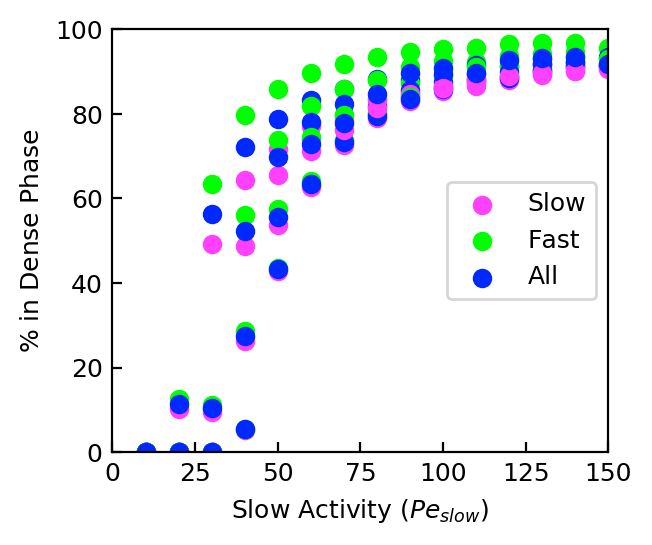

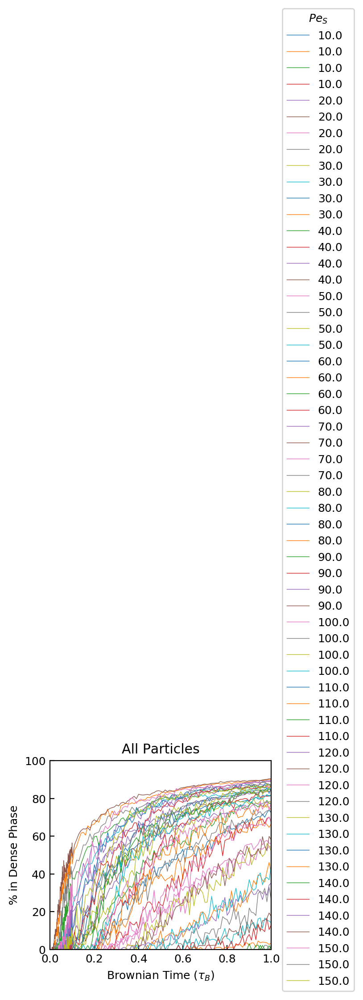

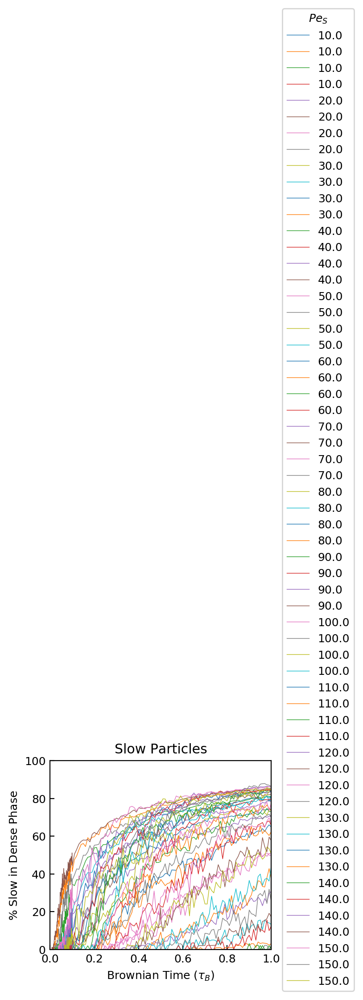

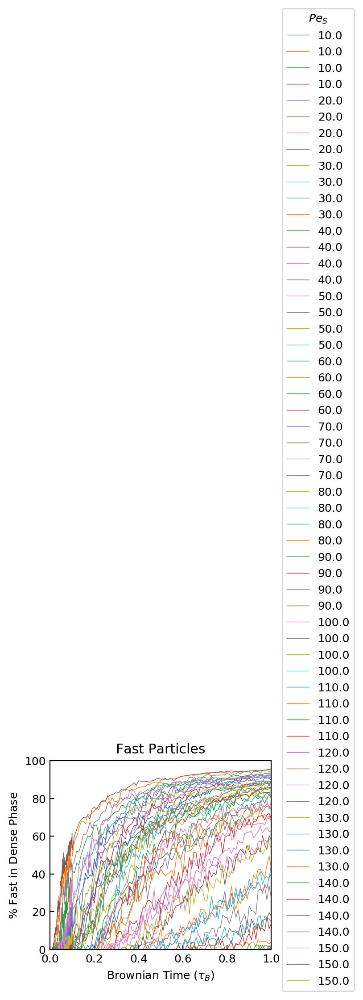

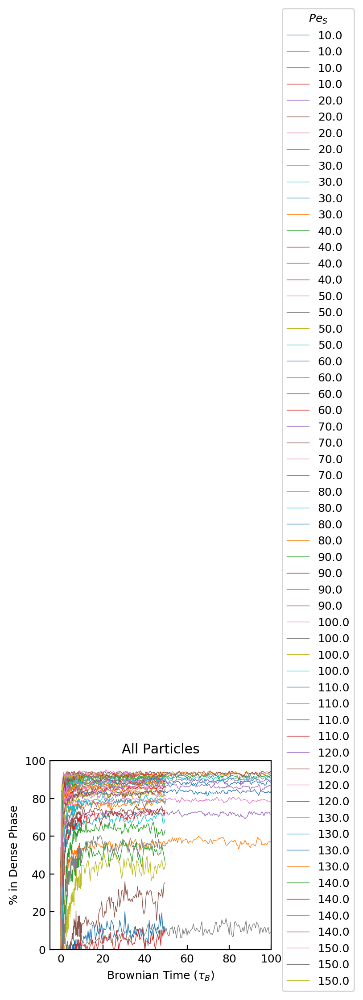

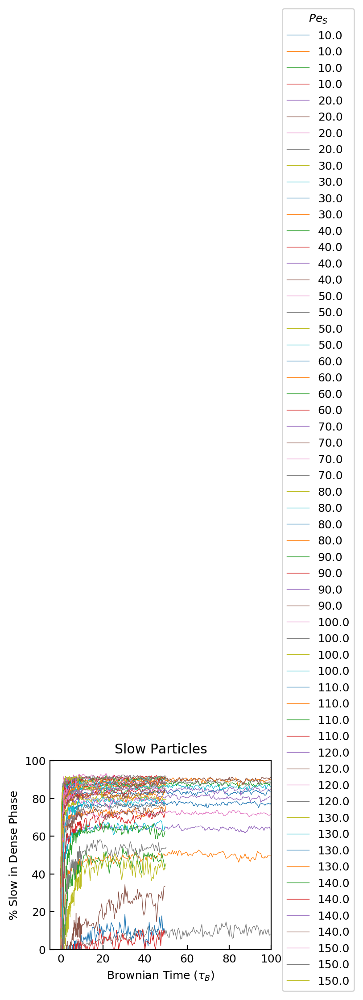

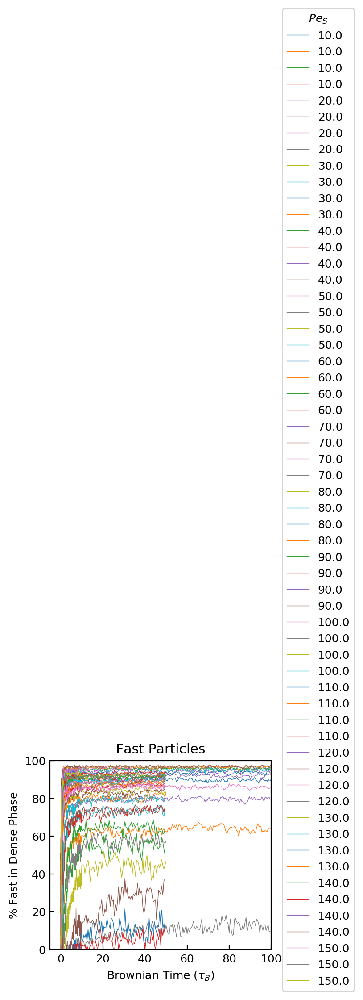

In [10]:
# Let's make plots without the plotter function

################################# Percent in dense phase #####################################
# SS
for i in xrange(numFiles):
    plt.scatter(params['peA'][i], SS['Dense_A'][i], c='#FF40FF', label='Slow')
    plt.scatter(params['peA'][i], SS['Dense_B'][i], c='#00FF00', label='Fast')
    plt.scatter(params['peA'][i], SS['Dense_tot'][i], c='#0029FF', label='All')
    
handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc=7)
plt.xlabel(r'Slow Activity $\left( Pe_{slow} \right)$')
plt.xlim(0, 150.0)
plt.ylabel(r'$\%$ in Dense Phase')
plt.ylim(0, 100)
plt.show()
# vs time
# All
for i in xrange(numFiles):
    plt.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_tot'] * 100.0 / params['partAll'][i],
             label=str(params['peA'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.40, -0.25), title=r'$Pe_{S}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(0, 1.0)
plt.ylabel(r'$\%$ in Dense Phase')
plt.ylim(0, 100)
plt.title('All Particles')
plt.show()
# A-type
for i in xrange(numFiles):
    plt.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_A'] * 100.0 / params['partA'][i],
             label=str(params['peA'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.40, -0.25), title=r'$Pe_{S}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(0, 1.0)
plt.ylabel(r'$\%$ Slow in Dense Phase')
plt.ylim(0, 100)
plt.title('Slow Particles')
plt.show()
# B-type
for i in xrange(numFiles):
    plt.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_B'] * 100.0 / params['partB'][i],
             label=str(params['peA'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.40, -0.25), title=r'$Pe_{S}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(0, 1.0)
plt.ylabel(r'$\%$ Fast in Dense Phase')
plt.ylim(0, 100)
plt.title('Fast Particles')
plt.show()

# Now all time
# All
for i in xrange(numFiles):
    plt.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_tot'] * 100.0 / params['partAll'][i],
             label=str(params['peA'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.40, -0.25), title=r'$Pe_{S}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(-5, 100.0)
plt.ylabel(r'$\%$ in Dense Phase')
plt.ylim(0, 100)
plt.title('All Particles')
plt.show()
# A-type
for i in xrange(numFiles):
    plt.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_A'] * 100.0 / params['partA'][i],
             label=str(params['peA'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.40, -0.25), title=r'$Pe_{S}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(-5, 100.0)
plt.ylabel(r'$\%$ Slow in Dense Phase')
plt.ylim(0, 100)
plt.title('Slow Particles')
plt.show()
# B-type
for i in xrange(numFiles):
    plt.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_B'] * 100.0 / params['partB'][i],
             label=str(params['peA'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.40, -0.25), title=r'$Pe_{S}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(-5, 100.0)
plt.ylabel(r'$\%$ Fast in Dense Phase')
plt.ylim(0, 100)
plt.title('Fast Particles')
plt.show()


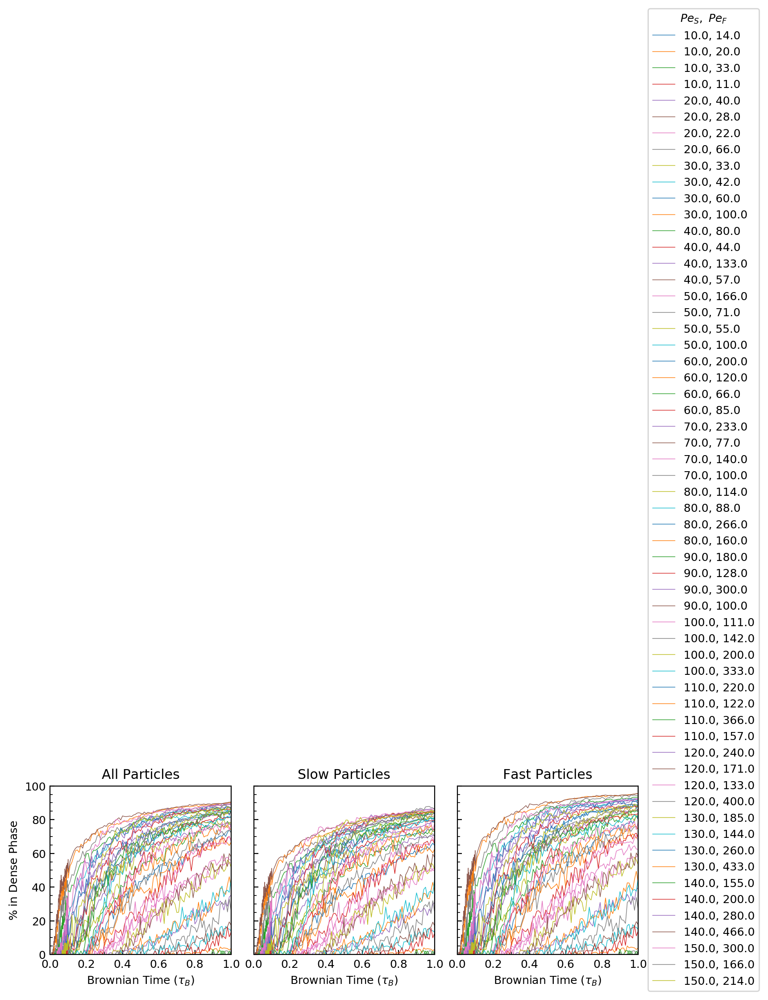

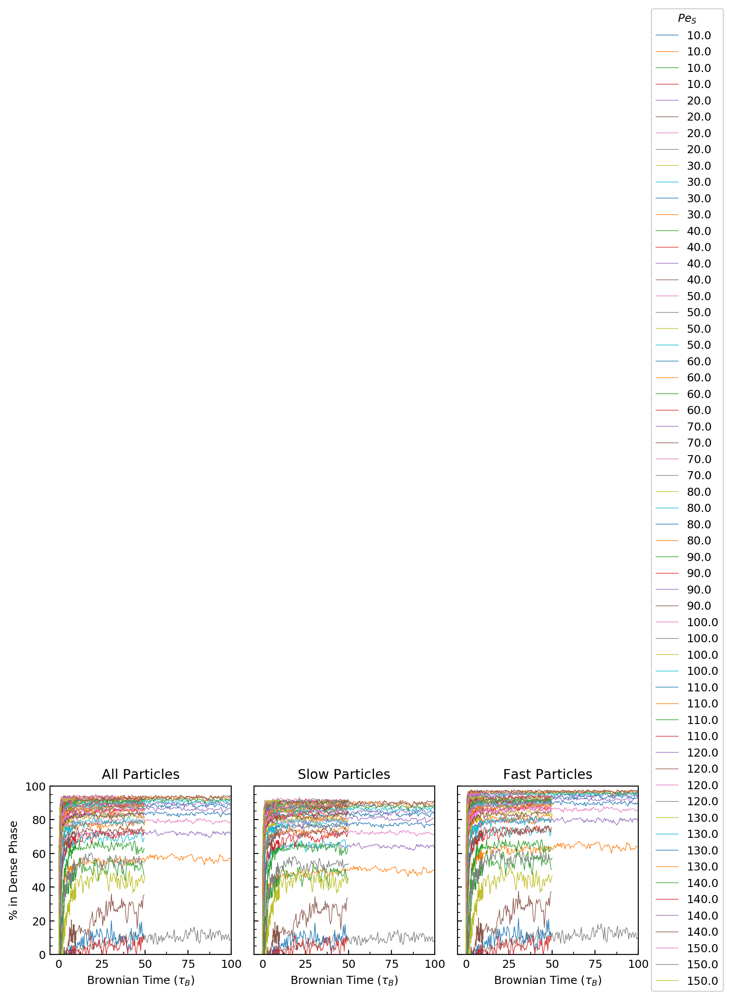

In [11]:
# Time resolved data side-by-side
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(8.5,2.5), sharey=True)
for i in xrange(numFiles):
    ax1.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_tot'] * 100.0 / params['partAll'][i],
             label="" + str(params['peA'][i]) + ", " + str(params['peB'][i]))
    ax2.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_A'] * 100.0 / params['partA'][i],
             label=str(params['peA'][i]))
    ax3.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_B'] * 100.0 / params['partB'][i],
             label=str(params['peA'][i]))
ax1.legend(loc = 4, bbox_to_anchor=(3.95, -0.25), title=r'$Pe_{S}, \ Pe_{F}$')
ax1.set_xlabel(r'Brownian Time $(\tau_{B})$')
ax2.set_xlabel(r'Brownian Time $(\tau_{B})$')
ax3.set_xlabel(r'Brownian Time $(\tau_{B})$')
ax1.set_ylabel(r'$\%$ in Dense Phase')
ax1.set_xlim(0, 1.0)
ax2.set_xlim(0, 1.0)
ax3.set_xlim(0, 1.0)
ax1.set_title('All Particles')
ax2.set_title('Slow Particles')
ax3.set_title('Fast Particles')
plt.ylim(0, 100)
plt.subplots_adjust(wspace = 0.125)
minorLocator = MultipleLocator(0.1)
ax1.xaxis.set_minor_locator(minorLocator)
ax2.xaxis.set_minor_locator(minorLocator)
ax3.xaxis.set_minor_locator(minorLocator)
minorLocator = MultipleLocator(5)
ax1.yaxis.set_minor_locator(minorLocator)
ax2.yaxis.set_minor_locator(minorLocator)
ax3.yaxis.set_minor_locator(minorLocator)
plt.show()

# Increase the observed time
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(8.5,2.5), sharey=True)
for i in xrange(numFiles):
    ax1.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_tot'] * 100.0 / params['partAll'][i],
             label=str(params['peA'][i]))
    ax2.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_A'] * 100.0 / params['partA'][i],
             label=str(params['peA'][i]))
    ax3.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Dense_B'] * 100.0 / params['partB'][i],
             label=str(params['peA'][i]))
ax1.legend(loc = 4, bbox_to_anchor=(3.75, -0.25), title=r'$Pe_{S}$')
ax1.set_xlabel(r'Brownian Time $(\tau_{B})$')
ax2.set_xlabel(r'Brownian Time $(\tau_{B})$')
ax3.set_xlabel(r'Brownian Time $(\tau_{B})$')
ax1.set_ylabel(r'$\%$ in Dense Phase')
ax1.set_xlim(-5, 100)
ax2.set_xlim(-5, 100)
ax3.set_xlim(-5, 100)
ax1.set_title('All Particles')
ax2.set_title('Slow Particles')
ax3.set_title('Fast Particles')
plt.ylim(0, 100)
plt.subplots_adjust(wspace = 0.125)
minorLocator = MultipleLocator(12.5)
ax1.xaxis.set_minor_locator(minorLocator)
ax2.xaxis.set_minor_locator(minorLocator)
ax3.xaxis.set_minor_locator(minorLocator)
minorLocator = MultipleLocator(5)
ax1.yaxis.set_minor_locator(minorLocator)
ax2.yaxis.set_minor_locator(minorLocator)
ax3.yaxis.set_minor_locator(minorLocator)
plt.show()


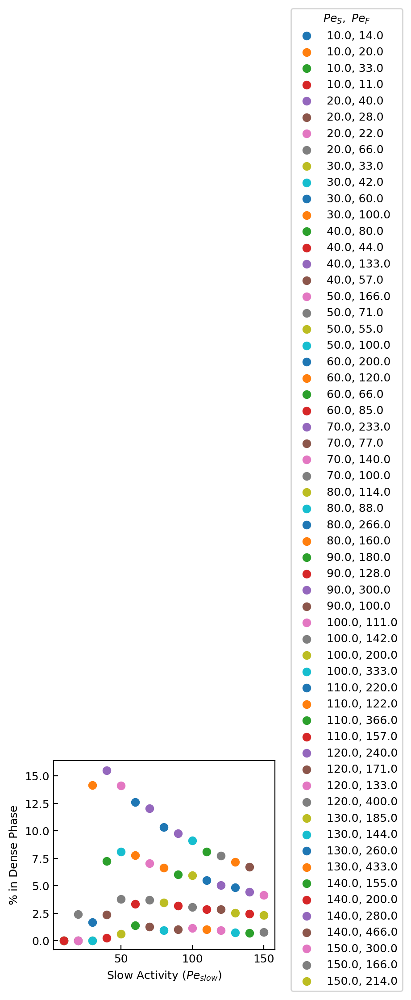

Slope=0.00212984788944, intercept=0.919866289048


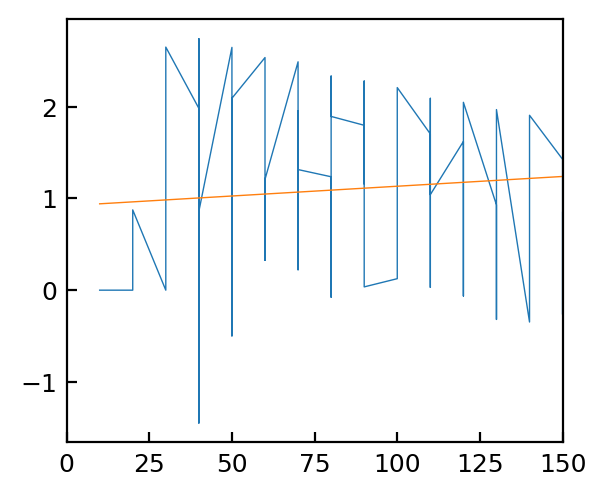

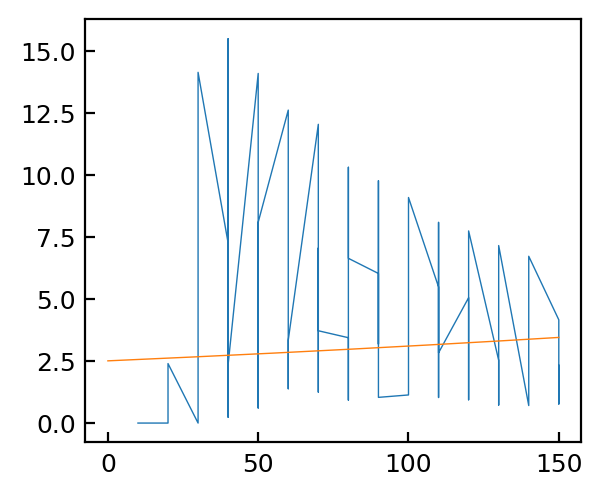

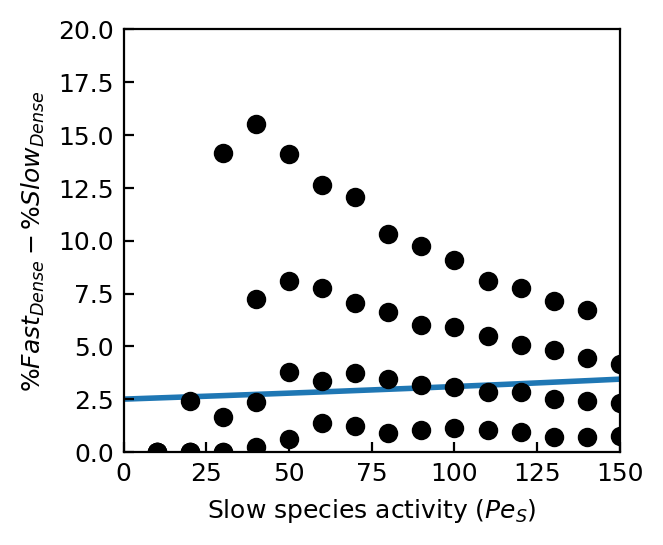

In [12]:
# Let's plot: % fast in dense phase - % slow in dense phase
# (for each magnitude of activity... is it constant?)
diffList = []
logDiff = []
logPeA = []
for i in xrange(numFiles):
    diffList.append(float(SS['Dense_B'][i] - SS['Dense_A'][i]))
    try:
        logDiff.append(math.log(diffList[i]))
    except:
        logDiff.append(0.0)
    logPeA.append(math.log(float(params['peA'][i])))
    
    plt.scatter(params['peA'][i], diffList[i],
                label="" + str(params['peA'][i]) + ", " + str(params['peB'][i]))
    
# plt.plot(params['peA'], diffList)
# plt.loglog(logPeA, logDiff)

handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(loc = 4, bbox_to_anchor=(1.60, -0.25), title=r'$Pe_{S}, \ Pe_{F}$')
plt.xlabel(r'Slow Activity $\left( Pe_{slow} \right)$')
# plt.xlim(0, 150.0)
plt.ylabel(r'$\%$ in Dense Phase')
# plt.ylim(0, 20)
plt.show()

# Exponential decay? y = ae^bx --> ln(y) = ln(a) + bx
def myLine(xx, mm, bb): # this is your 'straight line' y=f(x)
    return mm*xx + bb

xs = params['peA'][3:]
ys = logDiff[3:]
# Slope and intercept
b, tmp = curve_fit(myLine, xs, ys)[0] # your data x, y to fit
a = math.e ** tmp
lna = math.log(a)
print("Slope={}, intercept={}").format(b, lna)

chkLine = []
for i in xrange(len(params['peA'])):
    chkLine.append(myLine(params['peA'][i], b, lna))

plt.plot(params['peA'], logDiff)
plt.plot(params['peA'], chkLine)
plt.xlim(0, 150)
# plt.ylim(0.3, 1.25)
plt.show()

# Now let's plot our line with the original data
oxs = np.arange(0, 150, 0.001)
oys = np.zeros_like(oxs)
for i in xrange(len(oxs)):
    oys[i] = a * math.e ** (b * oxs[i])

plt.plot(params['peA'], diffList)
plt.plot(oxs, oys)
plt.show()

# When will there be no difference?
# ANSWER: at x = inf... this makes sense the activity ratio is 1 at that point
plt.plot(oxs, oys, lw=2, zorder = 1)
for i in xrange(numFiles):
    plt.scatter(params['peA'][i], diffList[i], zorder = 2, c='k',
                label="" + str(params['peA'][i]) + ", " + str(params['peB'][i]))
plt.xlim(0, 150)
plt.ylim(0, 20)
plt.xlabel(r'Slow species activity $(Pe_{S})$')
plt.ylabel(r'$\% Fast_{Dense} - \% Slow_{Dense}$')
plt.show()

In [13]:
################################## Percent in gas phase ######################################
# SS

# vs time

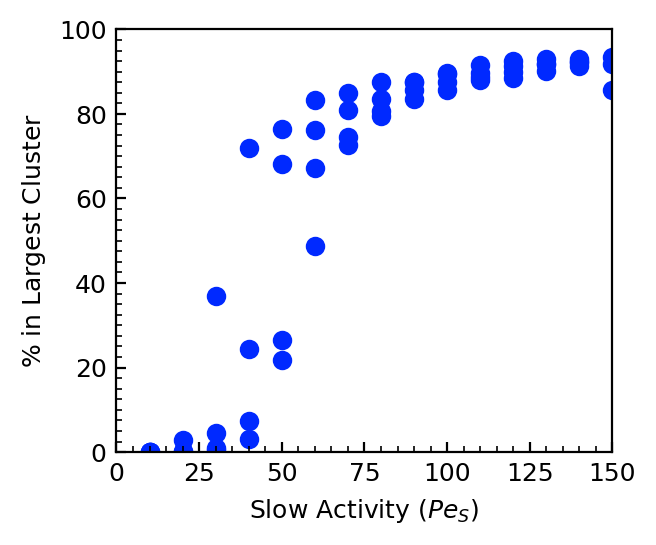

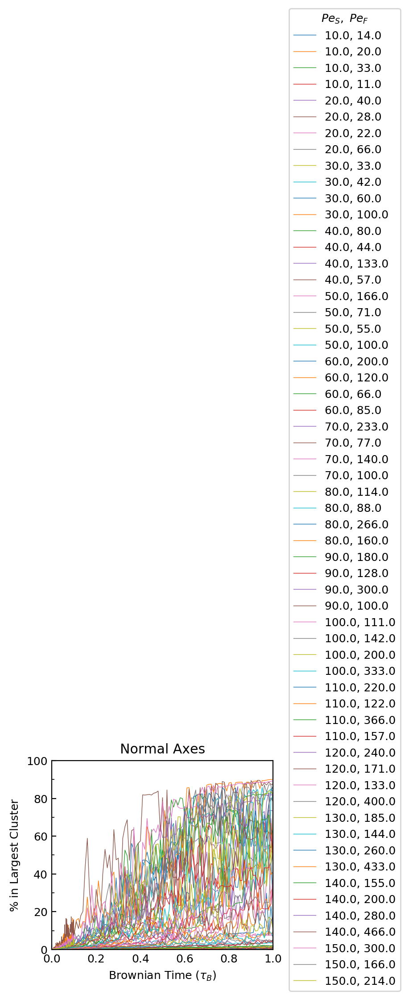

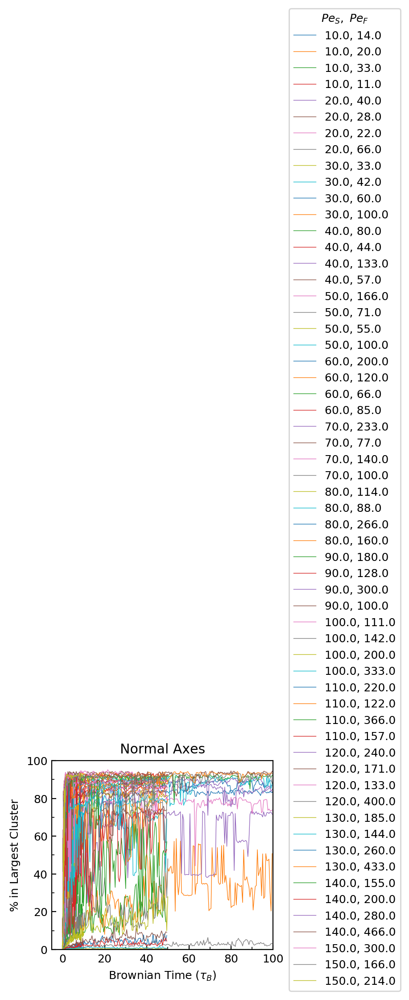

/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/matplotlib/axes/_base.py:3157: UserWarning: Attempted to set non-positive xlimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive xlimits for log-scale axis; '
/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/matplotlib/axes/_base.py:3477: UserWarning: Attempted to set non-positive ylimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive ylimits for log-scale axis; '


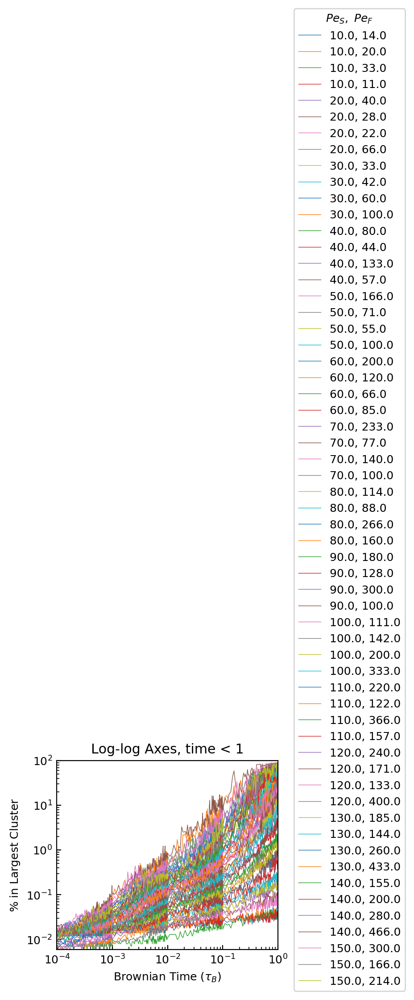

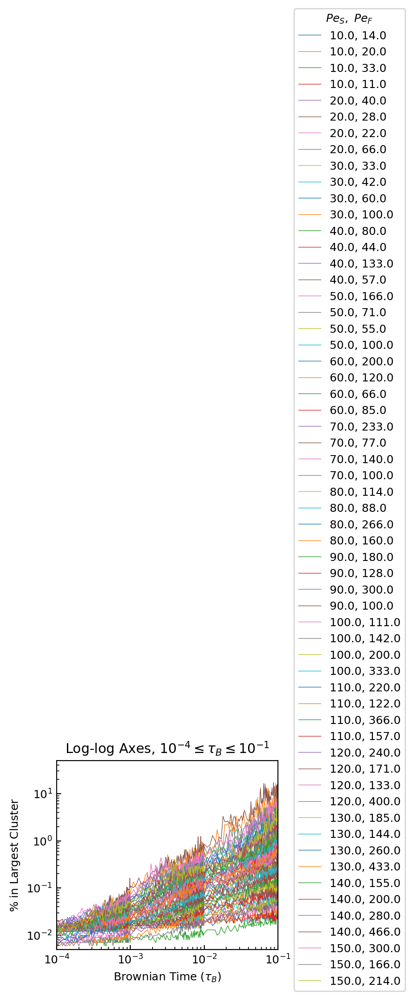

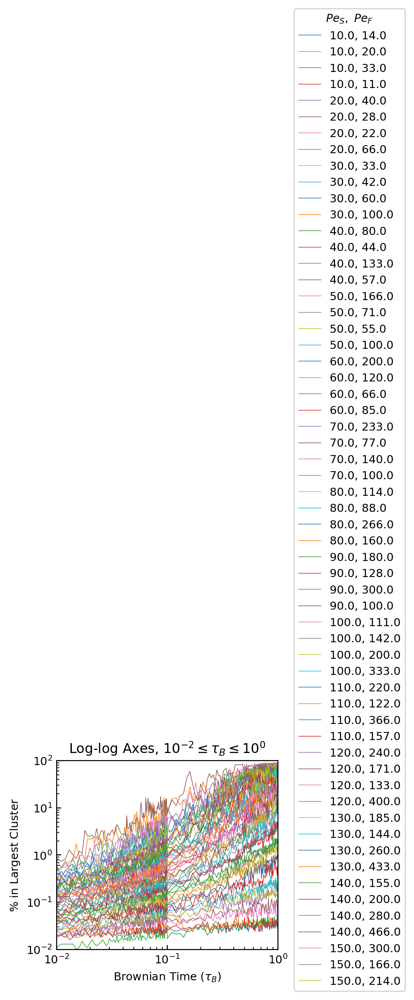

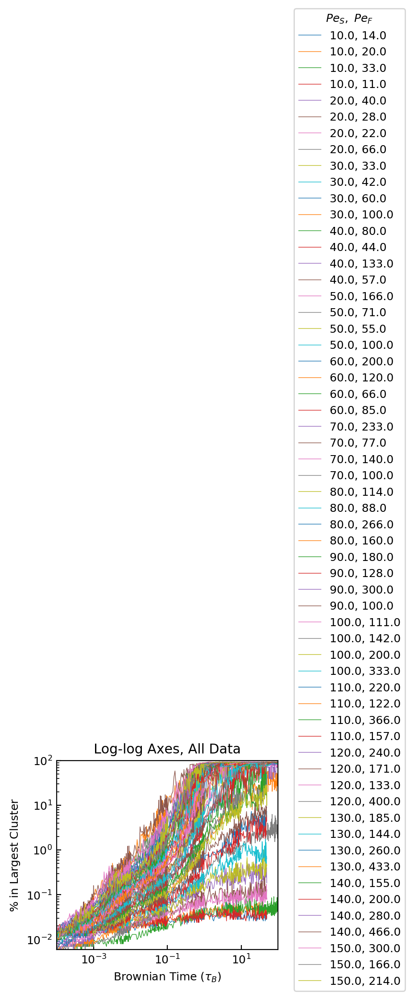

In [14]:
# Largest cluster ############################################################################
# SS
# SS
for i in xrange(numFiles):
    plt.scatter(params['peA'][i], SS['Lg_clust'][i], c='#0029FF')
    
plt.xlabel(r'Slow Activity $\left( Pe_{S} \right)$')
plt.xlim(0, 150.0)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(0, 100)
ax = plt.gca()
minorLocator = MultipleLocator(5.0)
ax.xaxis.set_minor_locator(minorLocator)
minorLocator = MultipleLocator(2.5)
ax.yaxis.set_minor_locator(minorLocator)
plt.show()

# vs time
for i in xrange(numFiles):
    plt.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label="" + str(params['peA'][i]) + ", " + str(params['peB'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.60, -0.25), title=r'$Pe_{S}, \ Pe_{F}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(0, 1.0)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(0, 100)
ax = plt.gca()
minorLocator = MultipleLocator(0.1)
ax.xaxis.set_minor_locator(minorLocator)
minorLocator = MultipleLocator(10)
ax.yaxis.set_minor_locator(minorLocator)
plt.title('Normal Axes')
plt.show()

# at longer times...
for i in xrange(numFiles):
    plt.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label="" + str(params['peA'][i]) + ", " + str(params['peB'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.60, -0.25), title=r'$Pe_{S}, \ Pe_{F}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(-5, 100.0)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(0, 100)
ax = plt.gca()
minorLocator = MultipleLocator(10)
ax.xaxis.set_minor_locator(minorLocator)
minorLocator = MultipleLocator(10)
ax.yaxis.set_minor_locator(minorLocator)
plt.title('Normal Axes')
plt.show()

# Now let's use some log axes...
# Short
for i in xrange(numFiles):
    plt.loglog(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label="" + str(params['peA'][i]) + ", " + str(params['peB'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.60, -0.25), title=r'$Pe_{S}, \ Pe_{F}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(0, 1.0)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(0, 100)
ax = plt.gca()
plt.title('Log-log Axes, time < 1')
plt.show()

# 10^-4 through 10^-1
for i in xrange(numFiles):
    plt.loglog(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label="" + str(params['peA'][i]) + ", " + str(params['peB'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.60, -0.25), title=r'$Pe_{S}, \ Pe_{F}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(10**-4, 10**-1)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(10**-2 / 2, 50)
ax = plt.gca()
plt.title(r'Log-log Axes, $10^{-4} \leq \tau_{B} \leq 10^{-1}$')
plt.show()

# 10^-2 through 10^0
for i in xrange(numFiles):
    plt.loglog(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label="" + str(params['peA'][i]) + ", " + str(params['peB'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.60, -0.25), title=r'$Pe_{S}, \ Pe_{F}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(10**-2, 10**0)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(10**-2, 100)
ax = plt.gca()
plt.title(r'Log-log Axes, $10^{-2} \leq \tau_{B} \leq 10^{0}$')
plt.show()

# Long
for i in xrange(numFiles):
    plt.loglog(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label="" + str(params['peA'][i]) + ", " + str(params['peB'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.60, -0.25), title=r'$Pe_{S}, \ Pe_{F}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(-5, 100.0)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(0, 100)
ax = plt.gca()
plt.title('Log-log Axes, All Data')
plt.show()

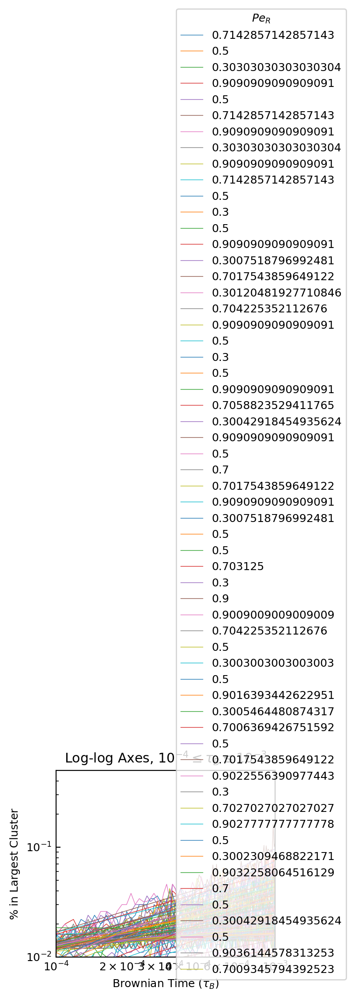

TypeError: Improper input: N=2 must not exceed M=1

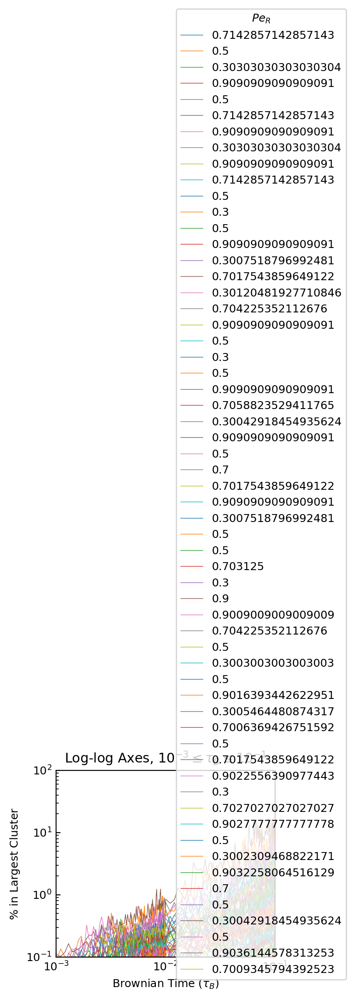

In [15]:
# Get correct indices for each regime
indices = []
for i in xrange(numFiles):
    tmp = []
    for j in xrange(len(all_sims[i]['Timestep'])):
        if 0.99*10**-4 <= all_sims[i]['Timestep'][j] / params['brownTime'][i] <= 1.01*10**-4:
            tmp.append(j)
        if 0.99*10**-3 <= all_sims[i]['Timestep'][j] / params['brownTime'][i] <= 1.01*10**-3:
            tmp.append(j)
        if 0.99*10**-1 <= all_sims[i]['Timestep'][j] / params['brownTime'][i] <= 1.01*10**-1:
            tmp.append(j)
    indices.append(tmp)

# # Check the index picking... it's fine
# for i in xrange(numFiles):
#     print("Regime one start: {}").format(all_sims[i]['Timestep'][indices[i][0]] / params['brownTime'][i])
#     print("Regime two start: {}").format(all_sims[i]['Timestep'][indices[i][1]] / params['brownTime'][i])
#     print("Regime three start: {}").format(all_sims[i]['Timestep'][indices[i][2]] / params['brownTime'][i])
    
# Fit each regime separately
# First 10^-4 through 10^-3
for i in xrange(numFiles):
    plt.loglog(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label=str(params['peR'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.35, -0.15), title=r'$Pe_{R}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(10**-4, 10**-3)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(10**-2, 5*10**-1)
ax = plt.gca()
plt.title(r'Log-log Axes, $10^{-4} \leq \tau_{B} \leq 10^{-3}$')

# Let's just fit regime 1...
mRegOne = []
for i in xrange(numFiles):
    # Regime 1
    # Time data
    x1 = (all_sims[i]['Timestep'][indices[i][0]:indices[i][1]] / params['brownTime'][i])
    # Largest cluster data
    y1 = (all_sims[i]['Lg_clust'][indices[i][0]:indices[i][1]] * 100.0 / params['partAll'][i])
    popt, pcov = curve_fit(loglogStraight, x1, y1)
    plt.loglog(x1, loglogStraight(x1, *popt),
               label='fit PeR=' + str(params['peR'][i]) + ': b=%5.3f' % (popt[1]))
    mRegOne.append(popt[1])
# plt.legend(loc = 4, bbox_to_anchor=(1.8, -0.15))
plt.show()

# Then 10^-3 through 10^-1
for i in xrange(numFiles):
    plt.loglog(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label=str(params['peR'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.35, -0.15), title=r'$Pe_{R}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(10**-3, 10**-1)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(10**-1, 10**2)
ax = plt.gca()
plt.title(r'Log-log Axes, $10^{-3} \leq \tau_{B} \leq 10^{-1}$')

# Let's just fit regime 2...
mRegTwo = []
for i in xrange(numFiles):
    # Regime 1
    # Time data
    x2 = (all_sims[i]['Timestep'][indices[i][1]:indices[i][2]] / params['brownTime'][i])
    # Largest cluster data
    y2 = (all_sims[i]['Lg_clust'][indices[i][1]:indices[i][2]] * 100.0 / params['partAll'][i])
    popt, pcov = curve_fit(loglogStraight, x2, y2)
    plt.loglog(x2, loglogStraight(x2, *popt),
               label='fit PeR=' + str(params['peR'][i]) + ': b=%5.3f' % (popt[1]))
    mRegTwo.append(popt[1])
# plt.legend(loc = 4, bbox_to_anchor=(1.8, -0.15))
plt.show()

# Let's combine the regimes and look at the fit:
for i in xrange(numFiles):
    plt.loglog(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label=str(params['peR'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.35, -0.15), title=r'$Pe_{R}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(10**-4, 10**-1)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(10**-2, 10**2)
ax = plt.gca()
plt.title(r'Log-log Axes, $10^{-4} \leq \tau_{B} \leq 10^{-1}$')

# Let's just fit regime 2...
mRegComb = []
for i in xrange(numFiles):
    # Combine regimes
    # Time data
    x3 = (all_sims[i]['Timestep'][indices[i][0]:indices[i][2]] / params['brownTime'][i])
    # Largest cluster data
    y3 = (all_sims[i]['Lg_clust'][indices[i][0]:indices[i][2]] * 100.0 / params['partAll'][i])
    popt, pcov = curve_fit(loglogStraight, x3, y3)
    plt.loglog(x3, loglogStraight(x3, *popt),
               label='fit PeR=' + str(params['peR'][i]) + ': b=%5.3f' % (popt[1]))
    mRegComb.append(popt[1])
# plt.legend(loc = 4, bbox_to_anchor=(1.8, -0.15))
plt.show()

# Plot slope fit for regime 1
# plt.plot(params['peR'], mRegOne)
# plt.show()
# Compute average slope regime 1
regOneAvg = np.mean(mRegOne)
print("Slope of regime 1: {}").format(regOneAvg)

# Plot slope fit for regime 2
# plt.plot(params['peR'], mRegTwo)
# plt.show()
# Compute average slope regime 1
regTwoAvg = np.mean(mRegTwo)
print("Slope of regime 2: {}").format(regTwoAvg)

# Plot slope fit for both
plt.plot(params['peR'], mRegComb)
plt.show()
# Compute average slope both
regBothAvg = np.mean(mRegComb)
print("Slope of both: {}").format(regBothAvg)

# What if I compute the difference of the slopes
diffSlopes = []
for i in xrange(numFiles):
    diffSlopes.append(mRegOne[i] - mRegTwo[i])
# plt.plot(params['peR'], diffSlopes)
# plt.show()

# Linear regression inverse time weighting


In [ ]:
# Let's put lines on this bitch
# 10^-4 through 10^-1
for i in xrange(numFiles):
    plt.loglog(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label=str(params['peR'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.35, -0.15), title=r'$Pe_{R}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(10**-4, 10**-1)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(10**-1 / 5, 250)
ax = plt.gca()
plt.title(r'Log-log Axes, $10^{-4} \leq \tau_{B} \leq 10^{-1}$')
# plt.show()

# Get x data, evaluate function, plot line
xs = np.arange(1.5*10**-4, 7*10**-4, 10**-4)
ys = np.zeros_like(xs)
for i in xrange(len(xs)):
    ys[i] = linearRel(1.25, xs[i], 10**3.5) 
plt.loglog(xs, ys)

xs = np.arange(2*10**-3, 5*10**-2, 10**-3)
ys = np.zeros_like(xs)
for i in xrange(len(xs)):
    ys[i] = linearRel(1.0, xs[i], 10**1.5) 
plt.loglog(xs, ys)

plt.show()

In [ ]:
%%capture
# Let's throw some lines on this data (and maybe normalize it)

# First let's go through and get the nucleation time
percThresh = 5
nucTime = []
for i in xrange(numFiles):
    for j in xrange(len(all_sims[i]['Lg_clust'])):
        curPerc = all_sims[i]['Lg_clust'][j] * 100.0 / float(params['partAll'][i])
        if curPerc >= percThresh:
            nucTime.append(all_sims[i]['Timestep'][j])
            break

reNorm = min(nucTime)
normNucTime = []
for i in xrange(numFiles):
    normNucTime.append(nucTime[i]/float(reNorm))
    
plt.plot(params['peR'], normNucTime)
plt.xlabel(r'Activity Ratio $\left( \frac{Pe_{slow}}{Pe_{fast}} \right)$')
plt.ylabel('Renormalization Constant')
plt.show()

# Now let's use this to normalize largest cluster relationship
# 10^-4 through 10^-1
for i in xrange(numFiles):
    plt.loglog(all_sims[i]['Timestep'] / params['brownTime'][i] / normNucTime[i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label=str(params['peR'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.35, -0.15), title=r'$Pe_{R}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(10**-5, 10**0)
plt.ylabel(r'$\%$ in Largest Cluster')
# plt.ylim(10**-1 / 5, 100)
ax = plt.gca()
plt.title(r'Log-log Axes, $10^{-4} \leq \tau_{B} \leq 10^{-1}$')
plt.show()

# Method two: just subtract the difference in nucleation time
subtractNuc = []
for i in xrange(numFiles):
    subtractNuc.append(nucTime[i] - reNorm)

# Subtract nucleation time
for i in xrange(numFiles):
    plt.loglog((all_sims[i]['Timestep'] - subtractNuc[i]) / params['brownTime'][i],
             all_sims[i]['Lg_clust'] * 100.0 / params['partAll'][i],
             label=str(params['peR'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.35, -0.15), title=r'$Pe_{R}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(10**-5, 10**0)
plt.ylabel(r'$\%$ in Largest Cluster')
plt.ylim(10**0, 100)
ax = plt.gca()
plt.title(r'Log-log Axes, $10^{-4} \leq \tau_{B} \leq 10^{-1}$')
plt.show()
    

In [ ]:
# Mean Cluster Size ##########################################################################
# SS

# vs time

In [ ]:
# Diameter: ALL, AA, AB, BB ##################################################################
# SS
for i in xrange(numFiles):
    plt.plot(all_sims[i]['Timestep'] / params['brownTime'][i],
             all_sims[i]['sigALL'],
             label=str(params['peR'][i]))
plt.legend(loc = 4, bbox_to_anchor=(1.35, -0.15), title=r'$Pe_{R}$')
plt.xlabel(r'Brownian Time $(\tau_{B})$')
plt.xlim(0, 100.0)
plt.ylabel(r'Particle Diameter $(\sigma_{int})$')
plt.ylim(0.995, 1.005)
ax = plt.gca()
minorLocator = MultipleLocator(5)
ax.xaxis.set_minor_locator(minorLocator)
minorLocator = MultipleLocator(0.001)
ax.yaxis.set_minor_locator(minorLocator)
plt.title('Normal Axes')
plt.show()

# vs time

In [ ]:
# Largest cluster area #######################################################################
# SS

# vs time

In [ ]:
# Largest cluster density ####################################################################
# SS

# vs time